## Adversarial attacks - parameter impact analysis on ResNet50

This notebook demonstrates several adversarial attacks (FGSM, PGD, CW, DeepFool) against a pre-trained ResNet50 model on a subset of ImageNet data.

In [1]:
import torch
import torch.utils.data as data
import torchvision.models as models
import torchvision.datasets as datasets

from attacks.fgsm import FGSM
from attacks.pgd import PGD
from attacks.cw import CW
from attacks.deepfool import DeepFool

from utils.helpers import preprocess, set_seed, get_fixed_parameter, load_imagenet_classes
from utils.evaluation import evaluate_attack, evaluate_all_attacks, print_accuracy_confidence
from utils.visualization import plot_accuracy_vs_param, visualize_accuracy_heatmap, visualize_adversarial_grid

## Configuration

In [ ]:
IMAGENET_VAL_DIR = './data/imagenet_val/'
LABEL_MAP_FILE = './data/imagenet_classes.txt'
BATCH_SIZE = 16 # How many images to process at once
NUM_IMAGES = 128 # How many images to process in total
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED = 806

# Set random seed for reproducibility
set_seed(SEED, DEVICE)

# Check device
print(f"Using device: {DEVICE}")

Using device: cuda


In [ ]:
if NUM_IMAGES > 1000:
    raise ValueError("NUM_IMAGES must be less than or equal to 1000, the number of images in the dataset.")

## Load model and data

### Load Pre-trained model (ResNet50)

In [3]:
# Load a pre-trained ResNet50 model
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
model = model.to(DEVICE)
model.eval()

print("ResNet50 model loaded successfully.")

ResNet50 model loaded successfully.


### Load ImageNet subset

In [4]:
# Create a dataset object
imagenet_data = datasets.ImageFolder(IMAGENET_VAL_DIR, preprocess)
print(f"Found {len(imagenet_data)} images in {IMAGENET_VAL_DIR}")
print(f"Class mapping (first 5): {list(imagenet_data.class_to_idx.items())[:5]}")

# Use a subset of the data
subset_indices = list(range(min(NUM_IMAGES, len(imagenet_data))))
imagenet_subset = data.Subset(imagenet_data, subset_indices)

# Create a DataLoader
test_loader = data.DataLoader(imagenet_subset, batch_size=BATCH_SIZE, shuffle=False)
print(f"Created DataLoader with {len(imagenet_subset)} images.")

Found 50000 images in ./imagenet_val/
Class mapping (first 5): [('n01440764', 0), ('n01443537', 1), ('n01484850', 2), ('n01491361', 3), ('n01494475', 4)]
Created DataLoader with 32 images.


### Load class labels

In [5]:
imagenet_classes = load_imagenet_classes(LABEL_MAP_FILE)
print(f"Loaded {len(imagenet_classes)} class names from index file.")
print("Sample class names:", list(imagenet_classes.items())[:5])

Loaded 1000 class names from index file.
Sample class names: [(0, 'tench'), (1, 'goldfish'), (2, 'great_white_shark'), (3, 'tiger_shark'), (4, 'hammerhead')]


## Parameter impact analysis

In [6]:
subset_indices_param_test = list(range(min(NUM_IMAGES, len(imagenet_data))))
imagenet_subset_param_test = data.Subset(imagenet_data, subset_indices_param_test)
param_test_loader = data.DataLoader(imagenet_subset_param_test, batch_size=BATCH_SIZE, shuffle=False)
print(f"\nParameter testing will use {NUM_IMAGES} images.")


Parameter testing will use 32 images.


### FGSM Parameter Impact (Epsilon)

In [7]:
# Controls the magnitude of the perturbation. Larger eps = stronger attack but more visible noise.
FGSM_EPSILONS = [0.001, 0.01, 0.07, 0.1, 0.3, 0.5]

Run attacks

In [8]:
fgsm_results = {}
clean_data_for_fgsm = None

print("\n--- Testing FGSM Epsilons ---")
for eps in FGSM_EPSILONS:
    print(f"\nTesting FGSM with epsilon = {eps}")
    fgsm_attack = FGSM(model, eps=eps)
    results, clean_results = evaluate_attack(fgsm_attack, param_test_loader, model, DEVICE, NUM_IMAGES)
    fgsm_results[eps] = results
    if clean_data_for_fgsm is None:
        clean_data_for_fgsm = clean_results
print("----------------------------")


--- Testing FGSM Epsilons ---

Testing FGSM with epsilon = 0.001
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 93.75%

Testing FGSM with epsilon = 0.01
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 81.25%

Testing FGSM with epsilon = 0.07
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 75.00%

Testing FGSM with epsilon = 0.1
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 75.00%

Testing FGSM with epsilon = 0.3
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 75.00%

Testing FGSM with epsilon = 0.5
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 65.62%
----------------------------


Plot results

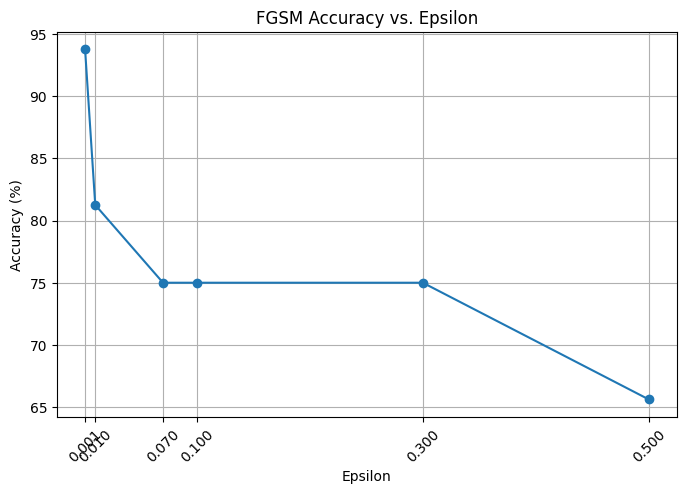

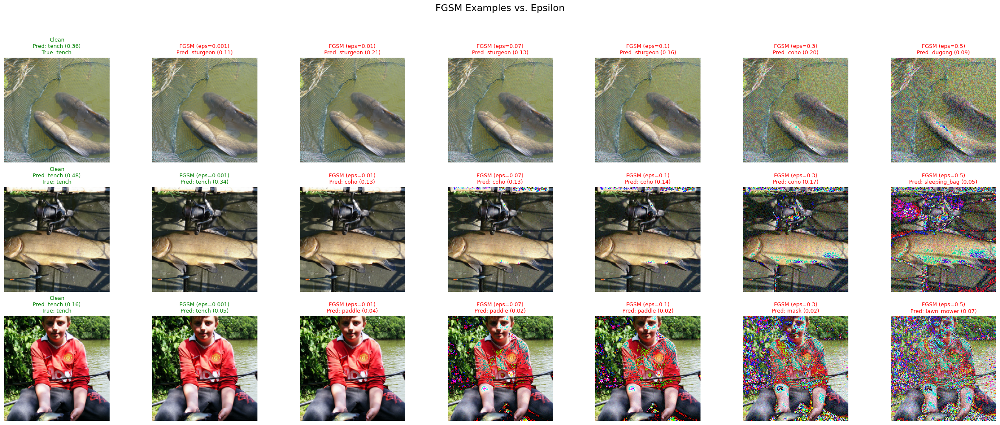

In [9]:
# Prepare data for plotting
fgsm_accuracies = [res['accuracy'] for res in fgsm_results.values()]

# Plot FGSM Accuracy vs Epsilon
plot_accuracy_vs_param(FGSM_EPSILONS, fgsm_accuracies, param_label='Epsilon', title='FGSM Accuracy vs. Epsilon')

# Visualize FGSM examples for different epsilons
num_samples_to_show = min(3, NUM_IMAGES)
fgsm_column_defs = [
    {'title_segment': f"FGSM (eps={eps})", 'data_results': fgsm_results[eps]} 
    for eps in FGSM_EPSILONS
]
visualize_adversarial_grid(
    num_samples_to_show=num_samples_to_show,
    clean_data=clean_data_for_fgsm,
    column_definitions=fgsm_column_defs,
    imagenet_classes=imagenet_classes,
    figure_suptitle="FGSM Examples vs. Epsilon"
)

### PGD Parameter Impact (Epsilon, Alpha, Steps)

In [10]:
# Maximum perturbation allowed. Larger eps = stronger attack but more visible noise.
PGD_EPSILONS = [0.001, 0.01, 0.07, 0.1]
# Step size for each iteration. Smaller alpha = more iterations needed to reach eps.
PGD_ALPHAS = [0.001, 0.01, 0.1]
# Number of iterations. More steps = potentially stronger attack but slower.
PGD_STEPS = [10, 30]

Run attacks

In [11]:
pgd_results = {}
clean_data_for_pgd = None

print("\n--- Testing PGD Parameter Combinations ---")
for eps in PGD_EPSILONS:
    for alpha in PGD_ALPHAS:
        for steps in PGD_STEPS:
            params = (eps, alpha, steps)
            print(f"\nTesting PGD with epsilon = {eps}, alpha = {alpha}, steps = {steps}")
            pgd_attack = PGD(model, eps=eps, alpha=alpha, steps=steps)
            results, clean_results = evaluate_attack(pgd_attack, param_test_loader, model, DEVICE, NUM_IMAGES)
            pgd_results[params] = results
            if clean_data_for_pgd is None:
                clean_data_for_pgd = clean_results

print("-----------------------------------------")


--- Testing PGD Parameter Combinations ---

Testing PGD with epsilon = 0.001, alpha = 0.001, steps = 10
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 93.75%

Testing PGD with epsilon = 0.001, alpha = 0.001, steps = 30
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 93.75%

Testing PGD with epsilon = 0.001, alpha = 0.01, steps = 10
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 93.75%

Testing PGD with epsilon = 0.001, alpha = 0.01, steps = 30
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 93.75%

Testing PGD with epsilon = 0.001, alpha = 0.1, steps = 10
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 93.75%

Testing PGD with epsilon = 0.001, alpha = 0.1, steps = 30
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 93.75%

Testing PGD with epsilon = 0.01, alpha = 0.001, steps = 10
  Processed 32 images. Stopping.
Attack evaluation finished. Accurac

Plot results

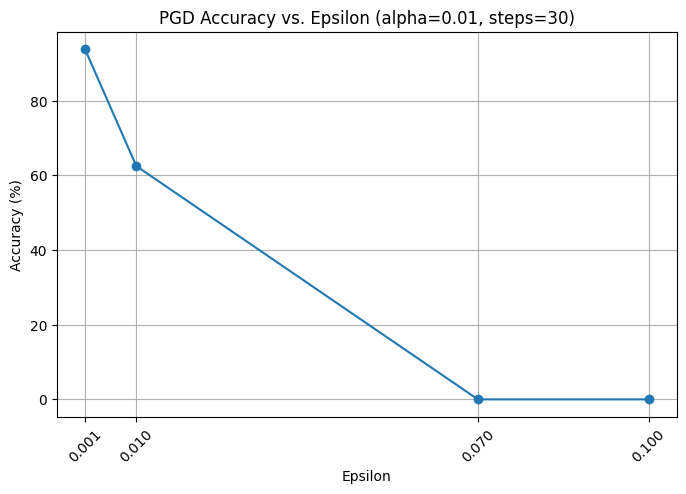

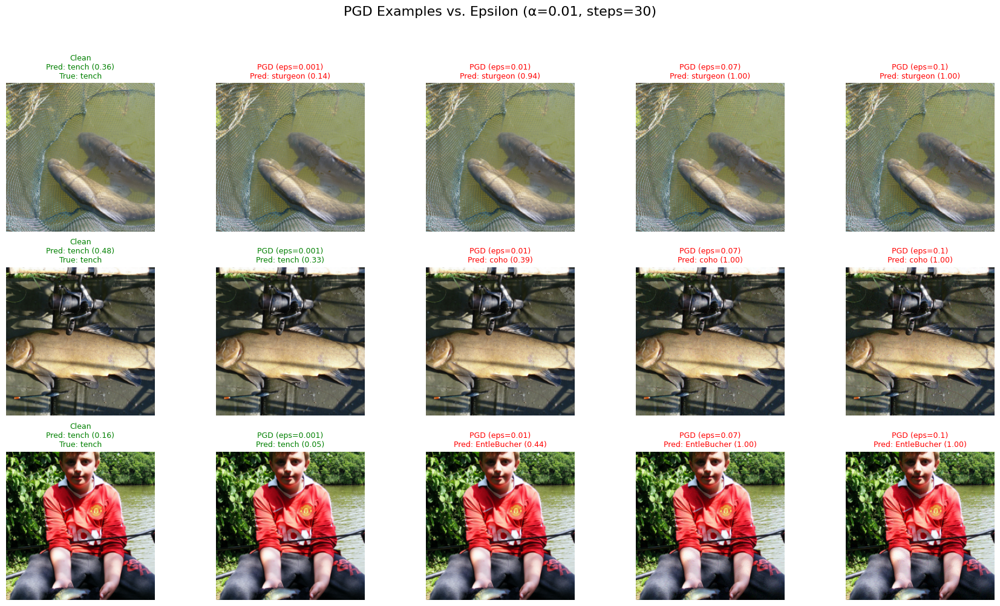

In [12]:
# Take median of alpha and steps for plotting
fixed_alpha = get_fixed_parameter(PGD_ALPHAS)
fixed_steps = get_fixed_parameter(PGD_STEPS)

pgd_accuracies_for_epsilon_plot = []
pgd_results_for_epsilon_visualization = {}

for eps_val in PGD_EPSILONS:
    # Construct the parameter tuple for the current epsilon and fixed alpha/steps
    current_params_key = (eps_val, fixed_alpha, fixed_steps)
    pgd_accuracies_for_epsilon_plot.append(pgd_results[current_params_key]['accuracy'])
    pgd_results_for_epsilon_visualization[eps_val] = pgd_results[current_params_key]

# Plot PGD Accuracy vs Epsilon (for the fixed alpha and steps)
plot_accuracy_vs_param(
    PGD_EPSILONS,
    pgd_accuracies_for_epsilon_plot,
    param_label='Epsilon',
    title=f'PGD Accuracy vs. Epsilon (alpha={fixed_alpha}, steps={fixed_steps})'
)

# Visualize PGD examples for different epsilons (for the fixed alpha and steps)
num_samples_to_show = min(3, NUM_IMAGES)
pgd_column_defs = [
    {'title_segment': f"PGD (eps={eps})", 'data_results': pgd_results_for_epsilon_visualization[eps]} 
    for eps in PGD_EPSILONS
]
visualize_adversarial_grid(
    num_samples_to_show=num_samples_to_show,
    clean_data=clean_data_for_pgd,
    column_definitions=pgd_column_defs,
    imagenet_classes=imagenet_classes,
    figure_suptitle=f"PGD Examples vs. Epsilon (α={fixed_alpha}, steps={fixed_steps})"
)

Heatmap visualization

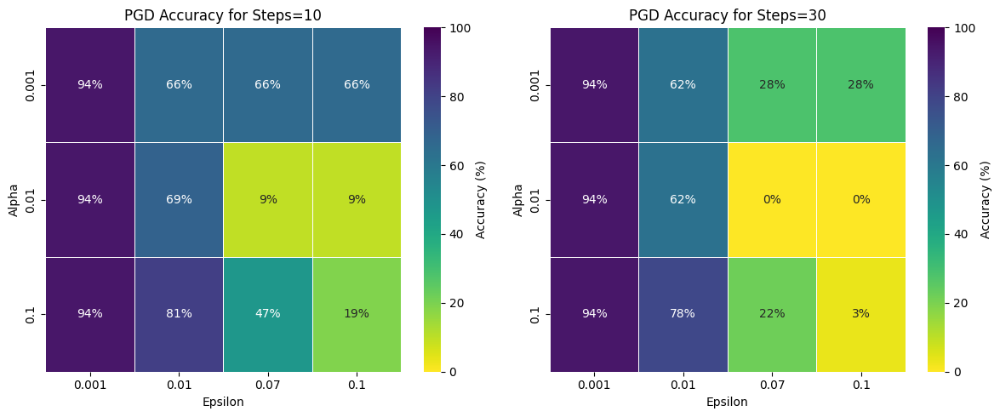

In [13]:
visualize_accuracy_heatmap(
    results_dict=pgd_results, 
    primary_param_values=PGD_EPSILONS, 
    secondary_param_values=PGD_ALPHAS, 
    primary_param_name='Epsilon', 
    secondary_param_name='Alpha', 
    title_prefix='PGD Accuracy',
    fixed_params_dict={'Steps': PGD_STEPS}
)

### CW Parameter Impact (C)

In [14]:
# CW:
# Controls the trade-off between perturbation magnitude and classification confidence. Higher c = stronger attack.
CW_CS = [0.1, 1, 10]
# Learning rate for the optimizer.
CW_LRS = [0.001, 0.01, 0.1]
# Number of optimization steps.
CW_STEPS_LIST = [1, 2, 10]
# Confidence parameter. Increase to make misclassification more confident. 0 means just misclassification.
CW_KAPPA = 0

Run attacks

In [15]:
cw_results = {}
clean_data_for_cw = None

print("\n--- Testing CW Parameter Combinations ---")
for c_val in CW_CS:
    for lr_val in CW_LRS:
        for steps_val in CW_STEPS_LIST:
            params = (c_val, lr_val, steps_val)
            print(f"\nTesting CW with c = {c_val}, lr = {lr_val}, steps = {steps_val}, kappa = {CW_KAPPA}")
            cw_attack = CW(model, c=c_val, kappa=CW_KAPPA, steps=steps_val, lr=lr_val)
            results, clean_results = evaluate_attack(cw_attack, param_test_loader, model, DEVICE, NUM_IMAGES)
            cw_results[params] = results
            if clean_data_for_cw is None:
                clean_data_for_cw = clean_results
print("-----------------------------------------")


--- Testing CW Parameter Combinations ---

Testing CW with c = 0.1, lr = 0.001, steps = 1, kappa = 0
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 96.88%

Testing CW with c = 0.1, lr = 0.001, steps = 2, kappa = 0
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 87.50%

Testing CW with c = 0.1, lr = 0.001, steps = 10, kappa = 0
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 28.12%

Testing CW with c = 0.1, lr = 0.01, steps = 1, kappa = 0
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 96.88%

Testing CW with c = 0.1, lr = 0.01, steps = 2, kappa = 0
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 50.00%

Testing CW with c = 0.1, lr = 0.01, steps = 10, kappa = 0
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 6.25%

Testing CW with c = 0.1, lr = 0.1, steps = 1, kappa = 0
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 96.88%

T

Plot results

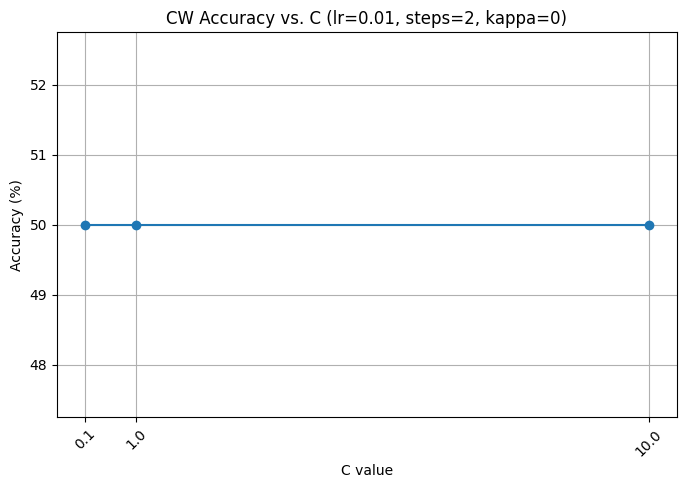

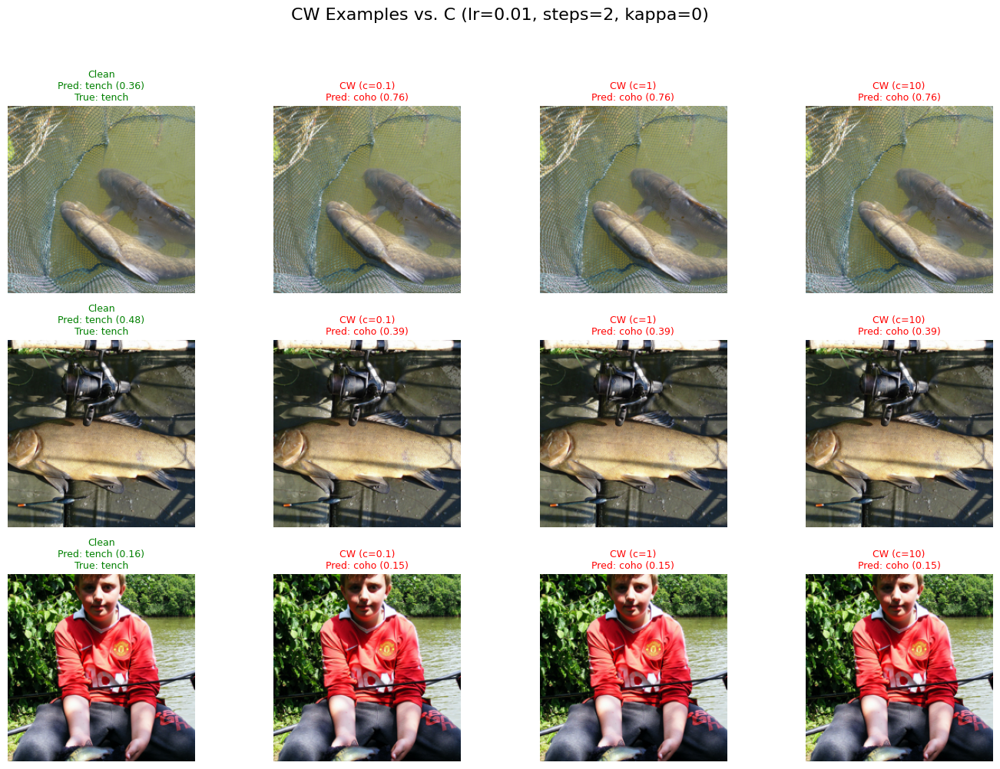

In [16]:
# Take median of lr and steps for plotting
fixed_lr = get_fixed_parameter(CW_LRS)
fixed_steps = get_fixed_parameter(CW_STEPS_LIST)

cw_accuracies_for_c_plot = []
cw_results_for_c_visualization = {}

for c_val in CW_CS:
    # Construct the parameter tuple for the current c and fixed lr/steps
    current_params_key = (c_val, fixed_lr, fixed_steps)
    cw_accuracies_for_c_plot.append(cw_results[current_params_key]['accuracy'])
    cw_results_for_c_visualization[c_val] = cw_results[current_params_key]

# Plot CW Accuracy vs C (for the fixed lr and steps)
plot_accuracy_vs_param(
    CW_CS,
    cw_accuracies_for_c_plot,
    param_label='C value',
    title=f'CW Accuracy vs. C (lr={fixed_lr}, steps={fixed_steps}, kappa={CW_KAPPA})'
)

# Visualize CW examples for different C values (for the fixed lr and steps)
num_samples_to_show = min(3, NUM_IMAGES)
cw_column_defs = [
    {'title_segment': f"CW (c={c_val})", 'data_results': cw_results_for_c_visualization[c_val]} 
    for c_val in CW_CS
]
visualize_adversarial_grid(
    num_samples_to_show=num_samples_to_show,
    clean_data=clean_data_for_cw,
    column_definitions=cw_column_defs,
    imagenet_classes=imagenet_classes,
    figure_suptitle=f"CW Examples vs. C (lr={fixed_lr}, steps={fixed_steps}, kappa={CW_KAPPA})"
)

Heatmap visualization

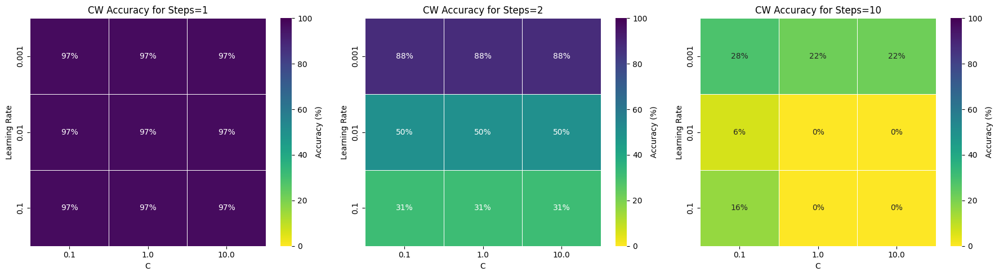

In [17]:
visualize_accuracy_heatmap(
    results_dict=cw_results, 
    primary_param_values=CW_CS, 
    secondary_param_values=CW_LRS, 
    primary_param_name='C', 
    secondary_param_name='Learning Rate', 
    title_prefix='CW Accuracy',
    fixed_params_dict={'Steps': CW_STEPS_LIST}
)

### DeepFool parameter impact (Steps, Overshoot)

In [ ]:
# DeepFool:
# Maximum number of iterations to find the boundary. Beware: increasing will make process painfully slow.
DF_STEPS = [1, 2, 5, 10]
# Factor to push the image slightly over the boundary.
DF_OVERSHOOT = [0.01, 0.1, 0.5]
# Model specific; ResNet50 is trained on ImageNet with 1000 classes.
NUM_CLASSES = 1000

Run attacks

In [19]:
deepfool_results = {}
clean_data_for_deepfool = None

print("\n--- Testing DeepFool Parameter Combinations ---")
for steps_val in DF_STEPS:
    for overshoot_val in DF_OVERSHOOT:
        params = (steps_val, overshoot_val)
        print(f"\nTesting DeepFool with steps = {steps_val}, overshoot = {overshoot_val}")
        deepfool_attack = DeepFool(model, steps_val, overshoot_val, NUM_CLASSES)
        results, clean_results = evaluate_attack(deepfool_attack, param_test_loader, model, DEVICE, NUM_IMAGES)
        deepfool_results[params] = results
        if clean_data_for_deepfool is None:
            clean_data_for_deepfool = clean_results
print("-----------------------------------------")


--- Testing DeepFool Parameter Combinations ---

Testing DeepFool with steps = 1, overshoot = 0.01
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 96.88%

Testing DeepFool with steps = 1, overshoot = 0.1
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 96.88%

Testing DeepFool with steps = 1, overshoot = 0.5
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 84.38%

Testing DeepFool with steps = 2, overshoot = 0.01
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 87.50%

Testing DeepFool with steps = 2, overshoot = 0.1
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 75.00%

Testing DeepFool with steps = 2, overshoot = 0.5
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 62.50%

Testing DeepFool with steps = 5, overshoot = 0.01
  Processed 32 images. Stopping.
Attack evaluation finished. Accuracy: 43.75%

Testing DeepFool with steps = 5, overshoot = 0.1
  

Plot results

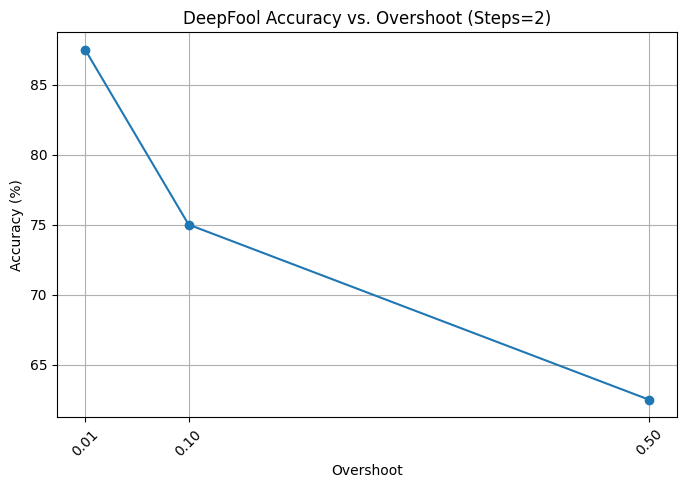

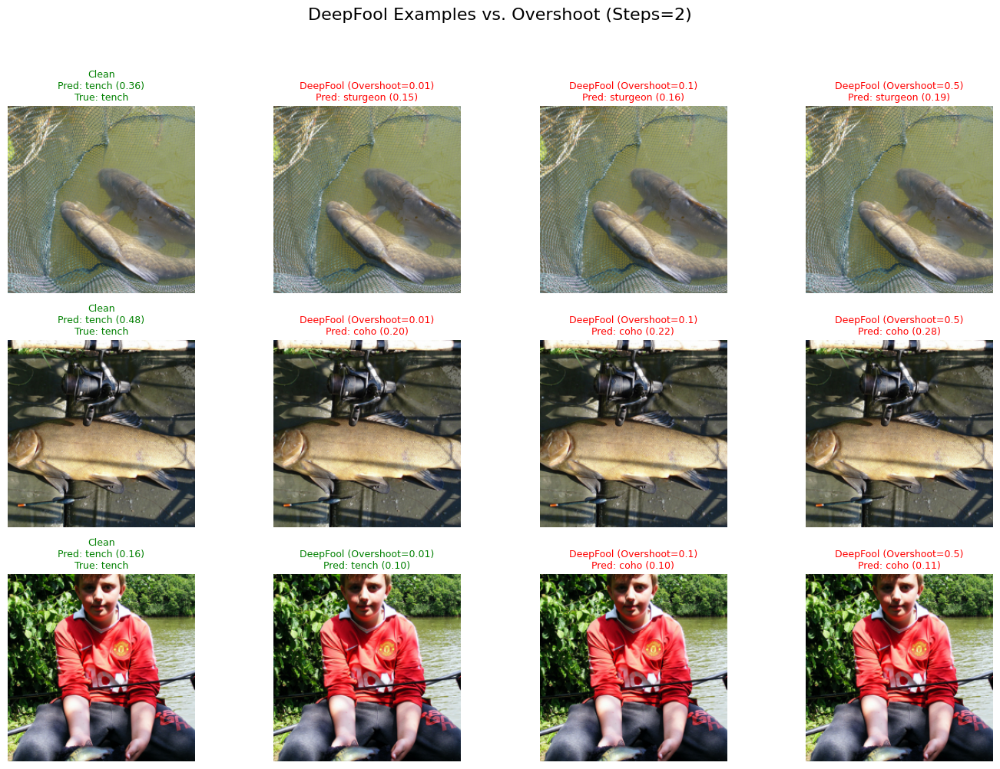

In [20]:
# Prepare data for plotting (median overshoot for steps plot, median steps for overshoot plot)
fixed_steps_df = get_fixed_parameter(DF_STEPS)
num_samples_to_show_df_overshoot = min(3, NUM_IMAGES)
df_accuracies_for_overshoot_plot = []
df_results_for_overshoot_visualization = {}

for overshoot_val in DF_OVERSHOOT:
    current_params_key = (fixed_steps_df, overshoot_val)
    df_accuracies_for_overshoot_plot.append(deepfool_results[current_params_key]['accuracy'])
    df_results_for_overshoot_visualization[overshoot_val] = deepfool_results[current_params_key]

# Plot DeepFool Accuracy vs. Overshoot (for fixed median steps)
plot_accuracy_vs_param(
    DF_OVERSHOOT,
    df_accuracies_for_overshoot_plot,
    param_label='Overshoot',
    title=f'DeepFool Accuracy vs. Overshoot (Steps={fixed_steps_df})'
)

# Visualize DeepFool examples for different overshoot (for fixed median steps)
df_column_defs = [
    {'title_segment': f"DeepFool (Overshoot={ov})", 'data_results': df_results_for_overshoot_visualization[ov]} 
    for ov in DF_OVERSHOOT
]
visualize_adversarial_grid(
    num_samples_to_show=num_samples_to_show_df_overshoot,
    clean_data=clean_data_for_deepfool,
    column_definitions=df_column_defs,
    imagenet_classes=imagenet_classes,
    figure_suptitle=f"DeepFool Examples vs. Overshoot (Steps={fixed_steps_df})"
)

Heatmap visualization

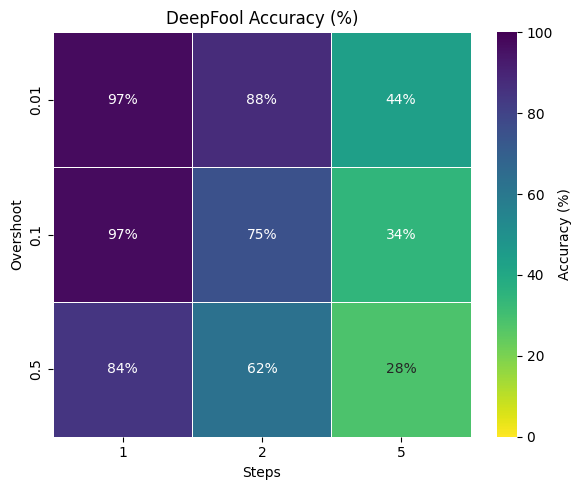

In [21]:
visualize_accuracy_heatmap(
    results_dict=deepfool_results, 
    primary_param_values=DF_STEPS, 
    secondary_param_values=DF_OVERSHOOT, 
    primary_param_name='Steps', 
    secondary_param_name='Overshoot', 
    title_prefix='DeepFool Accuracy'
)

## Attacks comparison

Fixed parameters for comparison

In [22]:
# FGSM
FGSM_EPSILON = 0.1

# PGD
PGD_EPSILON = 0.1
PGD_ALPHA = 0.01
PGD_STEPS = 10

# CW
CW_C = 1000
CW_STEPS = 100
CW_LR = 0.01
CW_KAPPA = 0

# DeepFool
DF_STEPS = 2
DF_OVERSHOOT = 0.1
NUM_CLASSES = 1000

Declare attacks

In [ ]:
# Initialize attacks dictionary
attacks = {}

# Add attacks using the fixed parameters
attacks['FGSM'] = FGSM(model, FGSM_EPSILON)
attacks['PGD'] = PGD(model, PGD_EPSILON, PGD_ALPHA, PGD_STEPS)
attacks['CW'] = CW(model, CW_C, CW_KAPPA, CW_STEPS, CW_LR)
attacks['DeepFool'] = DeepFool(model, DF_STEPS, DF_OVERSHOOT, NUM_CLASSES)

Run attacks

In [24]:
results = evaluate_all_attacks(
    attacks,
    test_loader,
    model,
    DEVICE,
    NUM_IMAGES,
    imagenet_classes
)


Starting evaluation...
  Batch 1/4: Processing 8 images...
    FGSM finished. Accuracy: 5/8
    PGD finished. Accuracy: 0/8
    CW finished. Accuracy: 0/8
    DeepFool finished. Accuracy: 5/8
  Batch 2/4: Processing 8 images...
    FGSM finished. Accuracy: 7/8
    PGD finished. Accuracy: 1/8
    CW finished. Accuracy: 0/8
    DeepFool finished. Accuracy: 6/8
  Batch 3/4: Processing 8 images...
    FGSM finished. Accuracy: 6/8
    PGD finished. Accuracy: 2/8
    CW finished. Accuracy: 0/8
    DeepFool finished. Accuracy: 6/8
  Batch 4/4: Processing 8 images...
    FGSM finished. Accuracy: 6/8
    PGD finished. Accuracy: 1/8
    CW finished. Accuracy: 0/8
    DeepFool finished. Accuracy: 7/8

Reached target number of images (32). Stopping.

Evaluation finished.


Visualize results

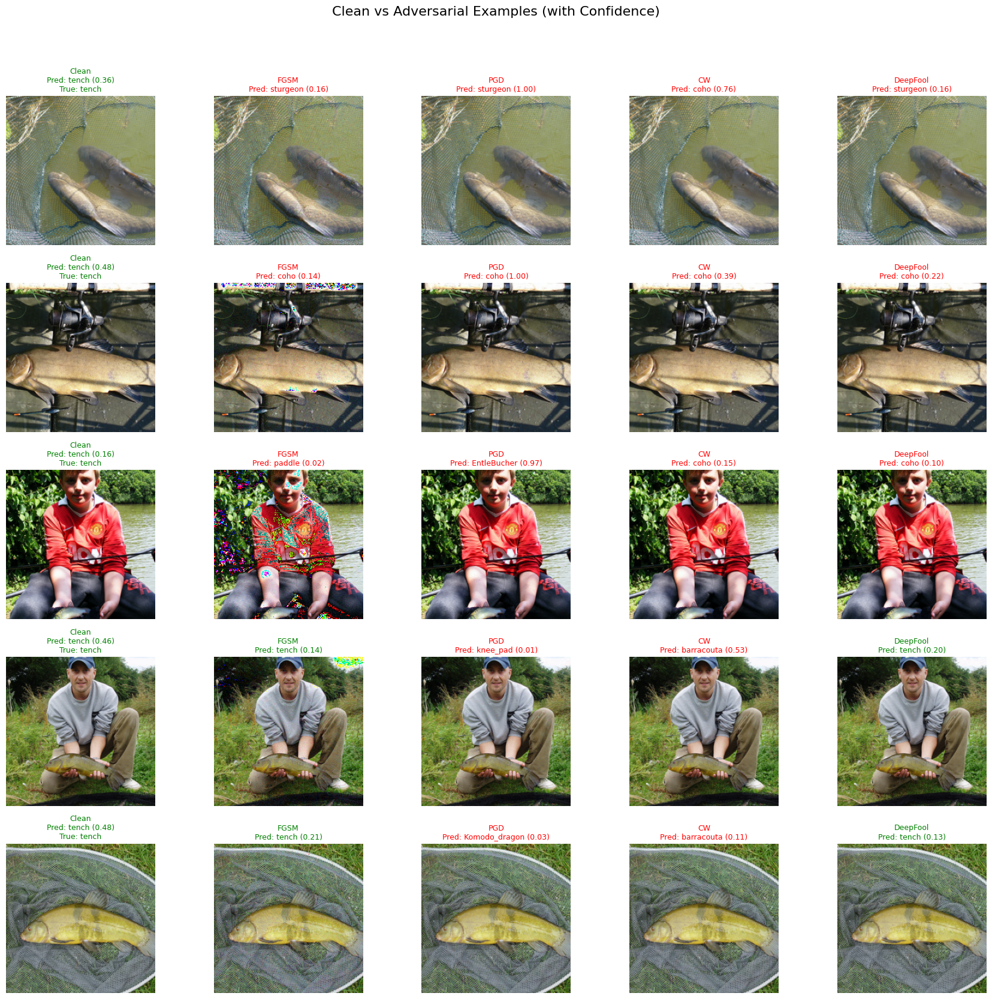

In [25]:
# Visualize sample results
num_samples_to_show = min(5, results['clean']['total'] if results['clean']['total'] > 0 else 0)
if num_samples_to_show > 0:
    comparison_column_defs = [
        {'title_segment': attack_name, 'data_results': results[attack_name]} 
        for attack_name in attacks.keys()
    ]
    visualize_adversarial_grid(
        num_samples_to_show=num_samples_to_show, 
        clean_data=results['clean'], 
        column_definitions=comparison_column_defs, 
        imagenet_classes=imagenet_classes, 
        figure_suptitle="Clean vs Adversarial Examples (with Confidence)"
    )

Print results

In [26]:
print_accuracy_confidence(results, attacks)

------------------------------
Accuracy and Average Confidence Results:
------------------------------
Clean Accuracy: 31/32 (96.88%)
Clean Avg Confidence: 0.4837
------------------------------
FGSM Accuracy: 24/32 (75.00%)
FGSM Avg Confidence: 0.1958
------------------------------
PGD Accuracy: 4/32 (12.50%)
PGD Avg Confidence: 0.3537
------------------------------
CW Accuracy: 0/32 (0.00%)
CW Avg Confidence: 0.3381
------------------------------
DeepFool Accuracy: 24/32 (75.00%)
DeepFool Avg Confidence: 0.2172
------------------------------
